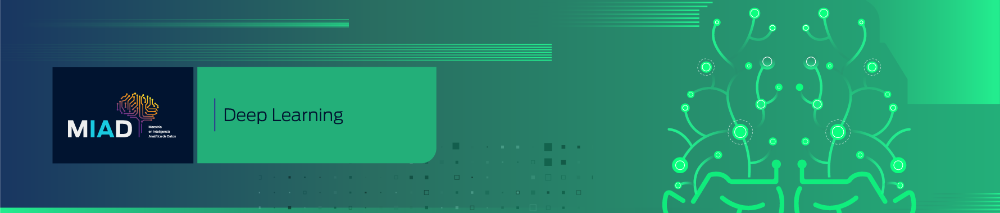

# Estrategias de implementación

## Redes neuronales usando Keras: Implementación en contexto real usando Keras

## Actividad calificada por el personal

### Propósito 

En el laboratorio "Estimación de red neuronal con múltiples capas" se propuso una implementación manual de redes neuronales usando librerías básicas de python como lo son *pandas* y *numpy*. *Google* desarrolló un *API* para el aprendizaje automático cuyo nombre es *"Keras"*, esta es escrita en *python* y es utilizada para hacer implementaciones de redes neuronales simples.

Así, en este *notebook* se pretende evaluar el uso de *keras* al aplicar una red neuronal en un contexto real. 

### Instrucciones generales

1. Para desarrollar el notebook, lo deberán descargar a un repositorio (pueden escoger el repositorio de su preferencia) para que lo puedan trabajar grupalmente.

2. Los procedimientos en el notebook deberán responderse en los espacios especificados para tal fin, debajo de cada uno de los puntos.

3. Para que la actividad sea calificada, deberán subir únicamente este mismo archivo con la extensión ".ipynb" a la actividad de "entrega calificada por el personal" correspondiente a este caso.

4. El archivo que suban debe poder ejecutarse localmente cuando sea descargado por el tutor, asumiendo que la base de datos de la actividad ya ha sido importada en el correspondiente archivo separado por comas (.csv).

### Criterios a evaluar

Los criterios que se evaluarán son:

Análisis preliminar de variables: Se presentan correlogramas, histogramas y estadísticas descriptivas de las variables de la base de datos y se hace un análisis coherente de cada uno de ellos. [30 puntos]

Estimación de un modelo utilizando redes neuronales: Se estima el modelo usando una red neuronal, se evalúa en la muestra de test y se analizan correctamente los resultados y el procedimiento realizado [30 puntos]

Elección del mejor modelo: Se elige la mejor combinación de hiperparámetros de acuerdo a los resultados obtenidos y justifica adecuadamente la selección. [40 puntos]


#### Problema

Un *manager* de un banco manifiesta preocupación porque los clientes están renunciando a las tarjetas de crédito. Este cuenta con los datos disponibles en 
https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers a cerca de 10000 clientes, si tiene productos activos o no (*"Attrition flag"*), en función de variables tales como edad, salario, estado civil, límite de tarjeta de crédito, categoría de tarjeta de crédito, etc.

Ustedes deben proponer el algoritmo para hacer la clasificación de los clientes con una red neuronal.

Tengan en cuenta que, para resolver los puntos de esta actividad, únicamente deben considerar las variables continuas (se deben eliminar las variables categóricas) y deberán eliminar las observaciones con datos faltantes.


### Librerías a importar

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from math import exp

In [2]:
import seaborn as sns
import tensorflow as tf
from tensorflow import keras

c:\Users\Daniel Martinez\AppData\Local\Programs\Python\Python313\Lib\site-packages\google\protobuf\runtime_version.py:98: UserWarning: Protobuf gencode version 5.28.3 is exactly one major version older than the runtime version 6.31.1 at tensorflow/core/framework/attr_value.proto. Please update the gencode to avoid compatibility violations in the next runtime release.
  warnings.warn(
c:\Users\Daniel Martinez\AppData\Local\Programs\Python\Python313\Lib\site-packages\google\protobuf\runtime_version.py:98: UserWarning: Protobuf gencode version 5.28.3 is exactly one major version older than the runtime version 6.31.1 at tensorflow/core/framework/tensor.proto. Please update the gencode to avoid compatibility violations in the next runtime release.
  warnings.warn(
c:\Users\Daniel Martinez\AppData\Local\Programs\Python\Python313\Lib\site-packages\google\protobuf\runtime_version.py:98: UserWarning: Protobuf gencode version 5.28.3 is exactly one major version older than the runtime version 6.3

### 1. Análisis preliminar de variables [30 puntos]

Realicen un análisis preliminar de los predictores y de la variable de respuesta (correlogramas, histogramas y estadísticas descriptivas).

In [ ]:
# Utilicen este espacio para escribir los códigos del procedimiento del punto 1 ####
data=pd.read_csv('BankChurners.csv')
data.info()
#se eliminan las filas con datos faltantes
data=data.dropna()
#se elimian las variables categóricas
#se eliminan los espacios en el nombre de las columnas
data.columns=data.columns.str.strip()
data=data.drop(['Gender','Marital_Status','Education_Level','Income_Category','Card_Category','Dependent_count','Total_Relationship_Count',"Months_Inactive_12_mon",'Contacts_Count_12_mon',
                'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2',
                "CLIENTNUM"],axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Attrition_Flag         10127 non-null  object 
 1   Customer_Age           10127 non-null  int64  
 2   Months_on_book         10127 non-null  int64  
 3   Credit_Limit           10127 non-null  float64
 4   Total_Revolving_Bal    10127 non-null  int64  
 5   Avg_Open_To_Buy        10127 non-null  float64
 6   Total_Amt_Chng_Q4_Q1   10127 non-null  float64
 7   Total_Trans_Amt        10127 non-null  int64  
 8   Total_Trans_Ct         10127 non-null  int64  
 9   Total_Ct_Chng_Q4_Q1    10127 non-null  float64
 10  Avg_Utilization_Ratio  10127 non-null  float64
dtypes: float64(5), int64(5), object(1)
memory usage: 870.4+ KB


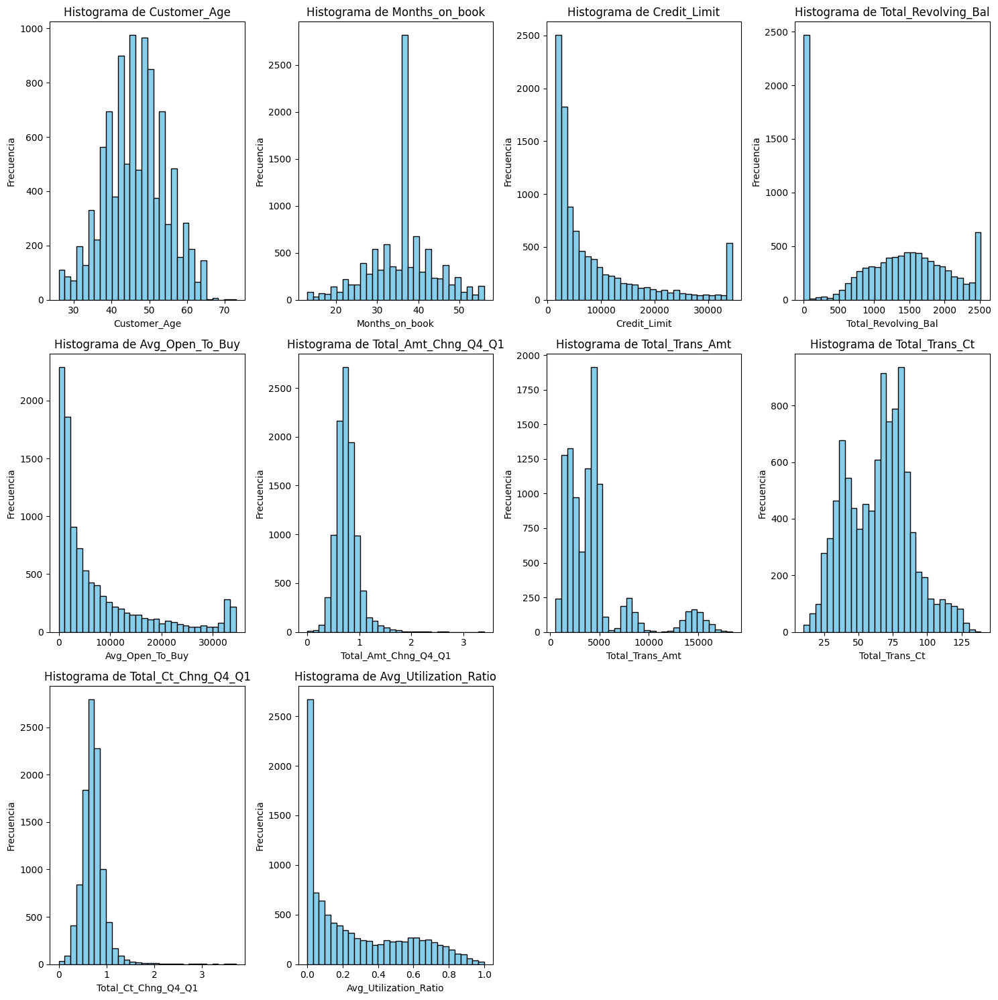

In [19]:
import matplotlib.pyplot as plt
numerical_columns = data.select_dtypes(include=['int',"float64"]).columns

# Determinar el tamaño de la cuadrícula
n_cols = 4
n_rows = (len(numerical_columns) + n_cols - 1) // n_cols  # Redondeo hacia arriba para que haya suficiente espacio

# Crear la figura y los ejes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()  # Aplanar los ejes para iterar sobre ellos fácilmente

# Generar un histograma para cada columna numérica
for i, col in enumerate(numerical_columns):
    axes[i].hist(data[col].dropna(), bins=30, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Eliminar cualquier gráfico extra (en caso de que haya más subplots que columnas)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espaciado entre gráficos
plt.tight_layout()
plt.show()

C:\Users\Daniel Martinez\AppData\Local\Temp\ipykernel_7556\3070119061.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_var], y=df[num_var], ax=ax, palette="Set2")
C:\Users\Daniel Martinez\AppData\Local\Temp\ipykernel_7556\3070119061.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
C:\Users\Daniel Martinez\AppData\Local\Temp\ipykernel_7556\3070119061.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_var], y=df[num_var], ax=ax, palette="Set2")
C:\Users\Daniel Martinez\AppData\Local\Temp\ipykernel_7556\3070119061.py:31: UserWarn

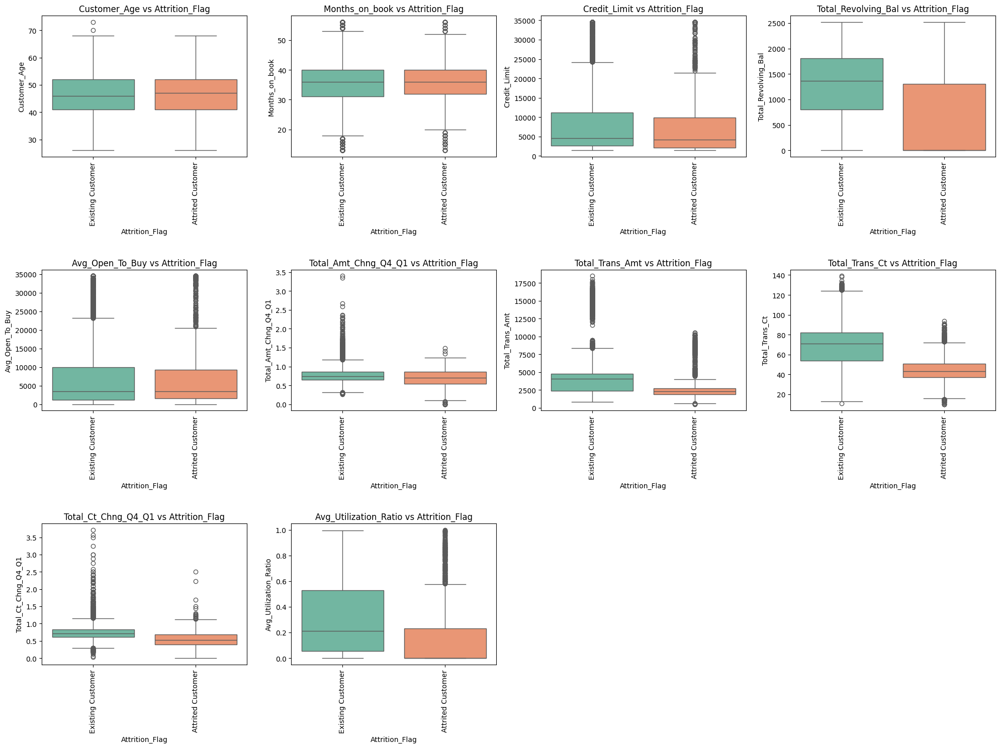

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_categorical_vs_numerical(df, cat_var):
   
    # Filtrar solo columnas numéricas (float e int)
    num_vars = df.select_dtypes(include=['number']).columns
    num_vars = [var for var in num_vars if var != cat_var]  # Excluir la categórica si es numérica
    
    # Si no hay variables numéricas, salir de la función
    if not num_vars:
        print("No hay variables numéricas para graficar.")
        return
    
    num_plots = len(num_vars)
    
    # Definir la cantidad de filas y columnas de manera óptima
    cols = 4  # Máximo 3 gráficos por fila
    rows = int(np.ceil(num_plots / cols))  # Calcular las filas necesarias
    
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(5 * cols, 5 * rows))
    axes = np.array(axes).flatten()  # Asegurar que `axes` sea un arreglo 1D para iterar

    # Generar boxplots
    for ax, num_var in zip(axes, num_vars):
        sns.boxplot(x=df[cat_var], y=df[num_var], ax=ax, palette="Set2")
        ax.set_title(f'{num_var} vs {cat_var}')
        ax.set_xlabel(cat_var)
        ax.set_ylabel(num_var)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Eliminar ejes vacíos si hay más subgráficos de los necesarios
    for ax in axes[len(num_vars):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.8)  # Ajustar espacio entre subgráficos
    plt.show()

# Verificar que Train está definido antes de llamar la función
if 'data' in locals():
    plot_categorical_vs_numerical(data, 'Attrition_Flag')
else:
    print("Error: La variable 'Train' no está definida.")

In [22]:
data.describe()

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,35.928409,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,8.016814,7.986416,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,26.000000,13.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,31.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,46.000000,36.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,52.000000,40.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,73.000000,56.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


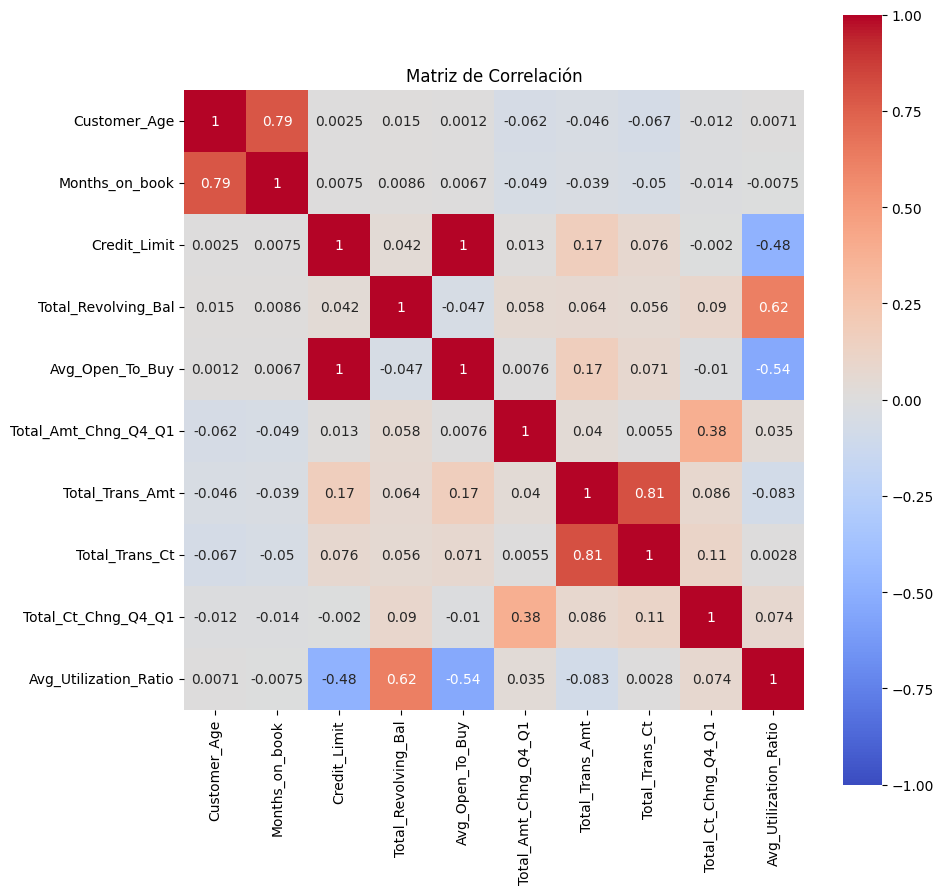

In [24]:
#Se genera mapa de correlacion entre variables 
numerical_data = data.select_dtypes(include=['int',"float64"])
import matplotlib.pyplot as plt
# Calcular la matriz de correlación
correlation_matrix = numerical_data.corr()

# Generar el heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, square=True)
plt.title("Matriz de Correlación")
plt.show()

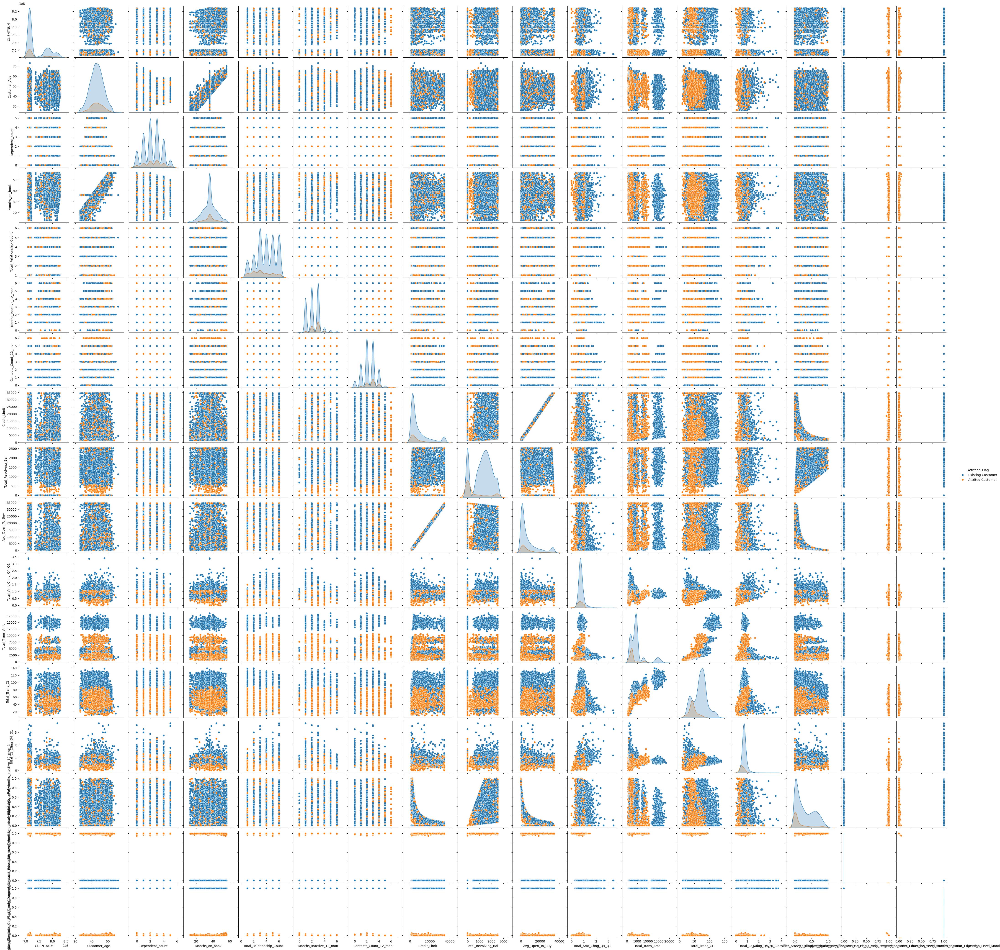

In [14]:
sns.pairplot(data=data, hue='Attrition_Flag')

## Procedimiento

1. Se cargó la base de datos `BankChurners.csv` utilizando la librería **pandas** mediante la función `read_csv()`. Posteriormente se inspeccionó la estructura del conjunto de datos con `data.info()` para identificar el tipo de variables, número de registros y presencia de valores faltantes.

2. Se realizó un proceso de limpieza de datos eliminando las filas que contenían valores nulos mediante `dropna()`, con el fin de evitar inconsistencias durante el análisis y el posterior entrenamiento de modelos.

3. Se estandarizaron los nombres de las columnas eliminando los espacios en blanco utilizando `data.columns.str.strip()`, garantizando así que las variables pudieran ser manipuladas correctamente dentro del código.

4. Se eliminaron variables categóricas  tales como: `Gender`, `Marital_Status`, `Education_Level`, `Income_Category`, `Card_Category`, `Dependent_count`, `Total_Relationship_Count`, `Months_Inactive_12_mon`, `Contacts_Count_12_mon`, las variables del clasificador Naive Bayes incluidas en el dataset y el identificador único `CLIENTNUM`. Esto se realizó con el objetivo de conservar únicamente variables numéricas útiles para el análisis exploratorio y el modelamiento.

5. Posteriormente se identificaron las variables numéricas del conjunto de datos y se generaron histogramas para cada una de ellas utilizando **matplotlib**, con el propósito de analizar la distribución de los datos, detectar posibles asimetrías, valores extremos y rangos de variación.

6. Se implementó una función que genera gráficos tipo **boxplot** para analizar la relación entre la variable categórica objetivo `Attrition_Flag` y cada una de las variables numéricas. Este procedimiento permitió evaluar visualmente diferencias en la distribución de las variables entre clientes que abandonan el servicio y los que permanecen.

7. Se calcularon estadísticas descriptivas del conjunto de datos mediante `data.describe()`, obteniendo medidas como media, desviación estándar, mínimo, máximo y cuartiles, las cuales permiten comprender el comportamiento general de las variables.

8. Finalmente, se calculó la matriz de correlación entre todas las variables numéricas y se representó mediante un **heatmap** utilizando la librería **seaborn**. Este análisis permitió identificar relaciones lineales entre variables, posibles redundancias y variables altamente correlacionadas.


## Consideraciones

1. El análisis se realizó únicamente con variables numéricas, debido a que las variables categóricas fueron eliminadas para simplificar el análisis exploratorio inicial.

2. Los registros con valores faltantes fueron eliminados del dataframe de entrenamiento tal como se plasmo en el inicio del taller 

## Analisis 

**Customer_Age**  
- Presenta una distribución aproximadamente normal centrada entre los 40 y 55 años. Esto indica que la mayor parte de los clientes del banco corresponde a población adulta media, mientras que existen pocos clientes jóvenes o de edades muy avanzadas.

- No se observan diferencias importantes entre clientes que abandonan y los que permanecen. Ambas distribuciones son muy similares, por lo que la edad no parece ser un factor determinante del abandono.


**Months_on_book**  
- La variable muestra una concentración importante entre 30 y 45 meses, lo que sugiere que la mayoría de los clientes llevan entre 2.5 y 4 años vinculados con la entidad financiera. Esto puede interpretarse como una cartera relativamente estable.

- El tiempo de vinculación con el banco también presenta comportamientos muy parecidos entre ambos grupos. Esto indica que la antigüedad del cliente por sí sola no explica el retiro de los clientes

**Credit_Limit**  
- Se observa una distribución altamente asimétrica positiva (cola larga hacia la derecha). La mayoría de clientes posee límites de crédito bajos o medios, mientras que un grupo pequeño presenta límites muy altos. Esto evidencia segmentación de clientes según su capacidad financiera.

- Los clientes que abandonan tienden a presentar límites de crédito ligeramente menores en comparación con los clientes activos. Esto sugiere que clientes con menor capacidad crediticia podrían tener mayor probabilidad de abandono.

**Avg_Open_To_Buy**  
- Presenta un comportamiento muy similar al del límite de crédito, lo cual es consistente ya que esta variable representa el cupo disponible. La concentración en valores bajos indica que muchos clientes utilizan buena parte de su cupo.

- El comportamiento es consistente con el límite de crédito. Los clientes que abandonan poseen menor cupo disponible en promedio, lo cual puede indicar menor actividad financiera o menor capacidad de endeudamiento.

**Total_Revolving_Bal**  
- Se observa una gran acumulación de valores cercanos a cero. Esto sugiere que una proporción considerable de clientes no mantiene deuda rotativa y probablemente paga el total de la tarjeta cada periodo de facturación.

- los clientes que permanecen presentan saldos rotativos mayores, mientras que muchos clientes que abandonan tienen valores cercanos a cero. Esto sugiere que los clientes que usan menos la tarjeta tienden a cancelarla.

**Total_Trans_Amt**  
- Muestra una distribución multimodal, lo cual indica la existencia de diferentes tipos de clientes: algunos realizan pocas compras, otros tienen uso moderado y un grupo más reducido realiza altos montos de transacciones.

- Los clientes existentes realizan montos de compra significativamente mayores que los clientes que abandonan. Esto indica que la baja actividad transaccional es un fuerte indicador de churn.

**Total_Trans_Ct**  
- Presenta una forma aproximadamente normal entre 40 y 90 transacciones. Esto indica que la mayoría de los clientes realiza un número moderado de operaciones durante el periodo analizado.

- Es una de las variables más discriminantes. Los clientes activos realizan muchas más transacciones que los clientes que abandonan. Esto refuerza la idea de que el abandono está fuertemente asociado al bajo uso del producto.


**Avg_Utilization_Ratio**  
- Se observa una fuerte concentración cerca de 0. Esto indica que la mayoría de clientes utiliza una pequeña proporción de su límite de crédito, mientras que pocos clientes tienen alta utilización.

- Los clientes que abandonan presentan, en general, menor utilización del crédito. Es decir, utilizan muy poco la tarjeta antes de cancelarla.

**Total_Amt_Chng_Q4_Q1**  
- Presenta una distribución concentrada alrededor de 1, lo que indica que la mayoría de los clientes mantiene un comportamiento estable en el monto de compras entre trimestres.

- Los clientes que abandonan muestran una reducción en el cambio del monto transado entre periodos. Esto sugiere que antes del abandono existe una disminución progresiva en el uso.


**Total_Ct_Chng_Q4_Q1**  
- Tiene una distribución similar, evidenciando que la cantidad de transacciones entre periodos no cambia significativamente para la mayoría de los clientes.

- El mismo patrón se observa en la cantidad de transacciones. Antes de cancelar la tarjeta, el cliente empieza a usarla cada vez menos.

En conjunto, los histogramas sugieren la presencia de diferentes perfiles de clientes dentro de la base de datos:

- Clientes con bajo uso de la tarjeta (bajo monto y pocas transacciones)
- Clientes de uso moderado (grupo mayoritario)
- Clientes de alto uso (alto monto, alto número de transacciones y mayor límite)

Las variables relacionadas con utilización del crédito, número de transacciones y montos de compra parecen especialmente relevantes para explicar el abandono del cliente, ya que reflejan directamente el nivel de actividad financiera del usuario con la tarjeta.

A partir del analisis del comportamiento de los cuartiles (Q1,Q2,Q3) mediante los boxplot realizado se evidencia que el  abandono del cliente no parece estar asociado a variables demográficas, sino principalmente a variables de comportamiento financiero.  

Los clientes que abandonan el banco presentan un patrón claro:

- Realizan menos transacciones
- Mueven menores montos de dinero
- Utilizan poco su cupo de crédito
- Reducen progresivamente el uso de la tarjeta antes de cancelarla

## Análisis de la Matriz de Correlación

La matriz de correlación permite identificar relaciones lineales entre variables:

- Existe una alta correlación positiva entre **Total_Trans_Amt** y **Total_Trans_Ct (≈ 0.81)**, lo cual es esperado: quien realiza más transacciones también mueve más dinero.
- **Customer_Age** y **Months_on_book (≈ 0.79)** están fuertemente correlacionadas, indicando que clientes mayores suelen tener más tiempo con el banco.
- **Avg_Utilization_Ratio** presenta correlación positiva con **Total_Revolving_Bal (≈ 0.62)**: a mayor deuda rotativa, mayor utilización del cupo.
- Existe correlación negativa entre **Avg_Utilization_Ratio** y **Avg_Open_To_Buy (≈ -0.54)**: cuando aumenta el cupo disponible, disminuye la utilización.
- También se observa correlación negativa entre **Credit_Limit** y **Avg_Utilization_Ratio (≈ -0.48)**, indicando que clientes con mayores límites suelen utilizar proporcionalmente menos su crédito.





### 2. Estimación del modelo usando una red neuronal con keras [30 puntos]

Estimen un modelo predictivo usando la muestra de entrenamiento y evalúen su desempeño en test con hiperparámetros de su selección.

In [37]:
#### Utilicen este espacio para escribir los códigos del procedimiento del punto 2 ####
from sklearn.preprocessing import StandardScaler
y=data["Attrition_Flag"]
X=data.drop("Attrition_Flag", axis=1)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y,test_size=0.2,random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full)
#Se escalan los datos
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

In [66]:
model = keras.models.Sequential()
model.add(keras.layers.Dense(400, activation="relu"))
model.add(keras.layers.Dense(100, activation="relu"))
model.add(keras.layers.Dense(1, activation="sigmoid"))

In [67]:
from tensorflow.keras.utils import plot_model

# Build the model by specifying the input shape
model.build(input_shape=(None, 10))

plot_model(model, show_shapes=True, show_layer_names=True)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [68]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                │ (None, 400)            │         4,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 100)            │        40,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │           101 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,601 (174.22 KB)

 Trainable params: 44,601 (174.22 KB)

 Non-trainable params: 0 (0.00 B)

In [69]:

model.compile(loss="binary_crossentropy",
 optimizer="sgd",
 metrics=["accuracy"])

In [ ]:
from tensorflow.keras.utils import to_categorical

# Convert string labels to integers
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_valid_enc = le.transform(y_valid)

history = model.fit(X_train, y_train_enc, epochs=30, validation_data=(X_valid, y_valid_enc))

Epoch 1/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8173 - loss: 0.4960 - val_accuracy: 0.8411 - val_loss: 0.3954
Epoch 2/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8393 - loss: 0.3725 - val_accuracy: 0.8475 - val_loss: 0.3440
Epoch 3/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8598 - loss: 0.3348 - val_accuracy: 0.8717 - val_loss: 0.3173
Epoch 4/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8803 - loss: 0.3130 - val_accuracy: 0.8776 - val_loss: 0.3008
Epoch 5/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8863 - loss: 0.2986 - val_accuracy: 0.8835 - val_loss: 0.2893
Epoch 6/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8891 - loss: 0.2876 - val_accuracy: 0.8860 - val_loss: 0.2801
Epoch 7/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8912 - loss: 0.2781 - val_accuracy: 0.8875 - val_loss: 0.2720
Epoch 8/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8920 - loss: 0.2696 - val_accuracy: 0.

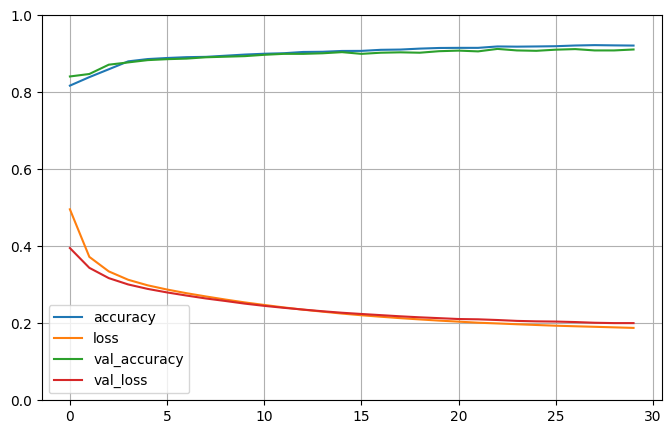

In [71]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

In [73]:
y_test_enc = le.transform(y_test)
test_loss, test_acc = model.evaluate(X_test, y_test_enc)

64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9210 - loss: 0.1999  


## Procedimiento

1. Se separó la variable objetivo `Attrition_Flag` del resto de variables del dataset.  
   Esta variable representa el abandono del cliente (clasificación binaria), mientras que el resto de columnas corresponden a las variables predictoras.

2. Posteriormente se dividió la base de datos en conjuntos de entrenamiento y prueba utilizando `train_test_split()`, asignando el **80%** de los datos para entrenamiento y el **20%** para prueba.  
  

3. El conjunto de entrenamiento se volvió a dividir en entrenamiento y validación. El conjunto de validación es fundamental en redes neuronales porque permite monitorear el aprendizaje del modelo durante las épocas de entrenamiento y detectar sobreajuste.

4. Antes de entrenar la red neuronal, se realizó la estandarización de las variables mediante `StandardScaler`.Las redes neuronales son altamente sensibles a la escala de las variables. Se realizo esta transformación de  las variables para que tengan media 0 y desviación estándar 1.

5. Se construyó una red neuronal artificial tipo **MLP (Multilayer Perceptron)** utilizando  Keras.  
   
   La forma de la red es:

   - Capa oculta 1: 400 neuronas con función de activación **ReLU**
   - Capa oculta 2: 100 neuronas con función de activación **ReLU**
   - Capa de salida: 1 neurona con función de activación **Sigmoid**

   La función ReLU introduce no linealidad al modelo y permite aprender relaciones complejas entre las variables.  
   La función Sigmoid en la salida permite obtener probabilidades entre 0 y 1, adecuadas para problemas de clasificación binaria.


6. El modelo fue compilado utilizando:

   - **Función de pérdida:** `binary_crossentropy`, adecuada para clasificación binaria.
   - **Optimizador:** `SGD (Stochastic Gradient Descent)`, encargado de ajustar los pesos de la red mediante backpropagation.
   - **Métrica:** `accuracy`, para medir el porcentaje de clasificaciones correctas.

8. La variable objetivo fue transformada mediante `LabelEncoder`, convirtiendo las etiquetas categóricas en valores numéricos (0 y 1).

9. Posteriormente se entrenó la red neuronal durante 30 épocas, utilizando el conjunto de validación para evaluar el desempeño del modelo en cada iteración.

10. Finalmente se graficó la evolución del entrenamiento (`loss` y `accuracy`) , lo que permitió observar la convergencia del modelo y su capacidad de generalización descartando que hubiera overfitting.



## Consideraciones

1. El problema corresponde a una clasificación  supervisada, donde el objetivo es predecir si un cliente abandonará el banco.

2. la estandarizacion de las variables predictoras  es un paso clave, ya que sin normalización las redes neuronales pueden presentar inestabilidad numérica y aprendizaje muy lento.

3. La función de activación Sigmoid en la capa de salida es apropiada porque permite interpretar la salida como probabilidad de abandono.


## Análisis

La red neuronal posee dos capas ocultas profundas (400 y 100 neuronas), lo que le permite modelar relaciones no lineales complejas. 

Durante el entrenamiento, el algoritmo **backpropagation** ajusta iterativamente los pesos de cada neurona minimizando la función de pérdida `binary_crossentropy`.  
El optimizador SGD realiza pequeñas actualizaciones de los pesos en cada lote de datos, permitiendo que el modelo converja progresivamente.

- La funcion de perdiad  entrenamiento  disminuye progresivamente → el modelo está aprendiendo patrones en los datos.
- La funcion de perdiad  de validacion sigue un comportamiento similar → el modelo generaliza correctamente sin tener sobreajuste
- La accuracy aumenta con las épocas → el modelo mejora su capacidad de clasificación.



## Conclusión

- La red neuronal construida permite modelar un problema de abandono de clientes como una función no lineal entre variables financieras y de comportamiento.  

- El uso del conjunto de validación confirma que el modelo no solo memoriza el conjunto de entrenamiento, sino que también generaliza a datos no vistos, por lo que constituye una aproximación adecuada para la predicción de churn en clientes bancarios.

- El modelo construido presenta un accuracy de 92.1% con respecto a los datos de test , lo que evidencia la buena capacidad predictiva del modelo para realizar predicciones sobre clientes con poitencial de declinar de su credito , en las pruebas realizadas no se evidencia sobre ajuste de la red a los datos de entrenamiento.

### 3. Elección del mejor modelo [40 puntos]

Ahora construyan una función que reciba por parámetro una lista de número de capas a utilizar,  números de neuronas por capa, así como funciones de activación a utilizar.

Dicha función debe entrenar el modelo con los datos de entrenamiento, evaluar con los datos de prueba para cada una de las combinaciones de hiperparámetros y encontrar cuál es la mejor combinación de hiperprámetros.  

Una vez hecho este procedimiento respondan a la siguiente pregunta:
 
¿Cómo argumenta que esta sea la selección óptima de hiperparámetros?

In [ ]:
#### Utilicen este espacio para escribir los códigos del procedimiento del punto 3 ####
from tensorflow.keras import layers

def construir_modelo(n_capas, neuronas, activaciones, input_dim):

    model = keras.Sequential()

    
    model.add(layers.Dense(neuronas[0],
                           activation=activaciones[0],
                           input_shape=(input_dim,)))

    
    for i in range(1, n_capas):
        model.add(layers.Dense(neuronas[i],
                               activation=activaciones[i]))

    
    model.add(layers.Dense(1, activation="sigmoid"))

    model.compile(
        optimizer="adam",
        loss="binary_crossentropy",
        metrics=["accuracy"]
    )

    return model

In [ ]:
#Definicion de funcion para buscar el mejor modelo

def buscar_mejor_modelo(X_train, y_train, X_test, y_test,
                        lista_capas,
                        lista_neuronas,
                        lista_activaciones,
                        epochs=20):

    mejor_accuracy = 0
    mejor_config = None
    mejor_modelo = None

    for n_capas in lista_capas:
        for neuronas in lista_neuronas:
            for activaciones in lista_activaciones:

                # validar tamaños
                if len(neuronas) != n_capas:
                    continue
                if len(activaciones) != n_capas:
                    continue

                print("\nProbando configuración:")
                print(f"Capas: {n_capas}")
                print(f"Neuronas: {neuronas}")
                print(f"Activaciones: {activaciones}")

                model = construir_modelo(
                    n_capas,
                    neuronas,
                    activaciones,
                    X_train.shape[1]
                )

                # entrenamiento
                model.fit(
                    X_train, y_train,
                    epochs=epochs,
                    verbose=0
                )

                # evaluación
                loss, acc = model.evaluate(X_test, y_test, verbose=0)

                print("Accuracy:", acc)

                # guardar mejor
                if acc > mejor_accuracy:
                    mejor_accuracy = acc
                    mejor_config = (n_capas, neuronas, activaciones)
                    mejor_modelo = model

    return mejor_modelo, mejor_config, mejor_accuracy


In [ ]:
#Datos de Entrada para la función de búsqueda
lista_capas = [1,2,3]

lista_neuronas = [
    [32],
    [64],
    [64,32],
    [128,64],
    [128,64,32]
]

lista_activaciones = [
    ["relu"],
    ["tanh"],
    ["relu","relu"],
    ["tanh","relu"],
    ["relu","relu","relu"]
]

mejor_modelo, mejor_config, mejor_acc = buscar_mejor_modelo(
    X_train, y_train_enc,
    X_valid, y_valid_enc,
    lista_capas,
    lista_neuronas,
    lista_activaciones,
    epochs=25
)

print("\nMEJOR CONFIGURACIÓN:")
print(mejor_config)
print("Mejor accuracy:", mejor_acc)



Probando configuración:
Capas: 1
Neuronas: [32]
Activaciones: ['relu']


c:\Users\Daniel Martinez\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\core\dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Accuracy: 0.9141165018081665

Probando configuración:
Capas: 1
Neuronas: [32]
Activaciones: ['tanh']
Accuracy: 0.9146100878715515

Probando configuración:
Capas: 1
Neuronas: [64]
Activaciones: ['relu']
Accuracy: 0.9160908460617065

Probando configuración:
Capas: 1
Neuronas: [64]
Activaciones: ['tanh']
Accuracy: 0.9126357436180115

Probando configuración:
Capas: 2
Neuronas: [64, 32]
Activaciones: ['relu', 'relu']
Accuracy: 0.926456093788147

Probando configuración:
Capas: 2
Neuronas: [64, 32]
Activaciones: ['tanh', 'relu']
Accuracy: 0.9239881634712219

Probando configuración:
Capas: 2
Neuronas: [128, 64]
Activaciones: ['relu', 'relu']
Accuracy: 0.9392892122268677

Probando configuración:
Capas: 2
Neuronas: [128, 64]
Activaciones: ['tanh', 'relu']
Accuracy: 0.9323790669441223

Probando configuración:
Capas: 3
Neuronas: [128, 64, 32]
Activaciones: ['relu', 'relu', 'relu']
Accuracy: 0.9348469972610474

MEJOR CONFIGURACIÓN:
(2, [128, 64], ['relu', 'relu'])
Mejor accuracy: 0.9392892122268677

(Utilicen este espacio para describir su procedimiento y escribir su análisis y conclusiones sobre el punto 3)